## 1. Libraries

In [1]:
# !pip install plotly

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import plotly.express as px

## 2. Data

In [3]:
os.listdir(r'D:\Belajar\Real Project\Uber Trip\Project 1..Uber New York Trip\uber-pickups-in-new-york-city')

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [4]:
files = os.listdir(r'D:\Belajar\Real Project\Uber Trip\Project 1..Uber New York Trip\uber-pickups-in-new-york-city')[-7:]
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [5]:
# remove unnecesary data

files.remove('uber-raw-data-janjune-15.csv')
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [6]:
path = r'D:\Belajar\Real Project\Uber Trip\Project 1..Uber New York Trip\uber-pickups-in-new-york-city'

final = pd.DataFrame()

for file in files:
    df = pd.read_csv(path + "/" + file, encoding = 'utf-8')
    final = pd.concat([final,df])

In [7]:
final.shape

(4534327, 4)

In [8]:
# copy the data, to make sure the original one is safe.

df = final.copy()

In [9]:
df.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4534327 entries, 0 to 1028135
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Date/Time  object 
 1   Lat        float64
 2   Lon        float64
 3   Base       object 
dtypes: float64(2), object(2)
memory usage: 173.0+ MB


In [11]:
df.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [12]:
# change the 'Date/Time' to time format

df['Date/Time'] = pd.to_datetime(df['Date/Time'], format = '%m/%d/%Y %H:%M:%S')

In [13]:
df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dtype: object

In [14]:
df.head()

,Date/Time,Lat,Lon,Base
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512


In [15]:
# Make some new columns to help analyse the data

df['weekday'] = df['Date/Time'].dt.day_name()
df['day'] = df['Date/Time'].dt.day
df['minute'] = df['Date/Time'].dt.minute
df['month'] = df['Date/Time'].dt.month
df['hour'] = df['Date/Time'].dt.hour

In [16]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,11,4,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,17,4,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,21,4,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,28,4,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,33,4,0


In [17]:
df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
weekday              object
day                   int64
minute                int64
month                 int64
hour                  int64
dtype: object

In [18]:
df['weekday'].value_counts()

Thursday     755145
Friday       741139
Wednesday    696488
Tuesday      663789
Saturday     646114
Monday       541472
Sunday       490180
Name: weekday, dtype: int64

In [19]:
df['weekday'].value_counts().index

Index(['Thursday', 'Friday', 'Wednesday', 'Tuesday', 'Saturday', 'Monday',
       'Sunday'],
      dtype='object')

## 3. Analysing Trips of Uber

### A. Analysis of Journey by Week-days

In [20]:
px.bar(x=df['weekday'].value_counts().index,
        y=df['weekday'].value_counts()
        )

The visualization tells us that the rush is definitely highest on Thusrday.

### B. Analysis of Journey by Hour

(array([216928., 103517., 227152., 543565., 324851., 366329., 819491.,
        660869., 579117., 692508.]),
 array([ 0. ,  2.3,  4.6,  6.9,  9.2, 11.5, 13.8, 16.1, 18.4, 20.7, 23. ]),
 <BarContainer object of 10 artists>)

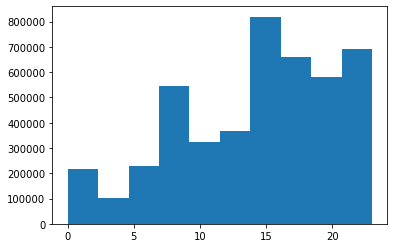

In [21]:
plt.hist(df['hour'])

In [22]:
df['month'].unique()

array([4, 8, 7, 6, 5, 9], dtype=int64)

In [23]:
# for i, month in enumerate (df['month'].unique()):
#    print (i)
#    print (month)

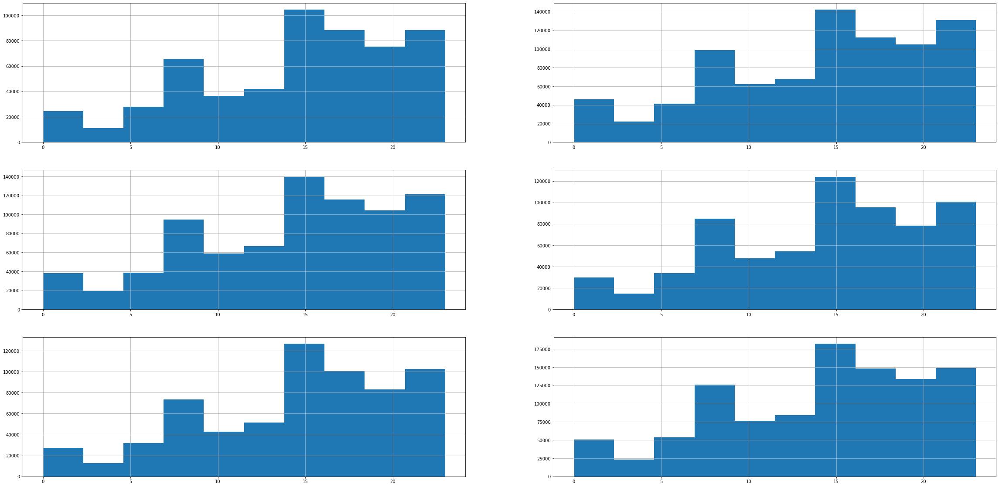

In [24]:
plt.figure(figsize=(40,20))

for i, month in enumerate (df['month'].unique()):
    plt.subplot(3,2,i+1)
    df[df['month']==month]['hour'].hist()

The conclusion is peek time almost at evening hours each month.

## 4. Analysing Monthly Rides

### A. Which Month has Highest Number of Rides?

In [25]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,11,4,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,17,4,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,21,4,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,28,4,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,33,4,0


In [26]:
# !pip install chart_studio

In [27]:
import chart_studio.plotly as py
import plotly.graph_objs as go 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [28]:
df.groupby('month')['hour'].count()

month
4     564516
5     652435
6     663844
7     796121
8     829275
9    1028136
Name: hour, dtype: int64

In [29]:
trace1 = go.Bar(
    x = df.groupby('month')['hour'].count().index,
    y = df.groupby('month')['hour'].count(),
    name = 'Priority'
)

In [30]:
iplot([trace1])

September has highest hours of ride.

### B. Analysis of Journey of Each Day

D:\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='day', ylabel='Density'>

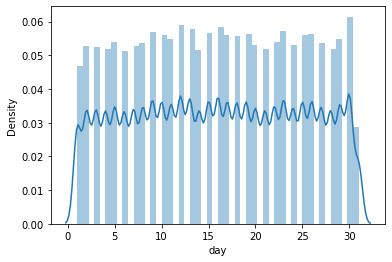

In [31]:
# Check the distribution of the data

sns.distplot(df['day'])

Text(0.5, 1.0, 'Journey by Month Day')

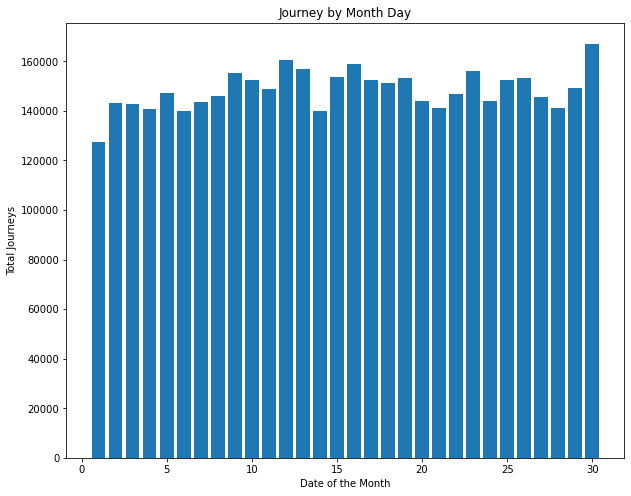

In [32]:
plt.figure (figsize = (10, 8))
plt.hist (df['day'], bins = 30, rwidth = 0.8, range = (0.5, 30.5))
plt.xlabel ('Date of the Month')
plt.ylabel ('Total Journeys')
plt.title ('Journey by Month Day')

We can see that the higest ride of every month occured at date 30.

## 3.	Analysing Demand of Uber

### A. Analysis of Total Rides Monthly

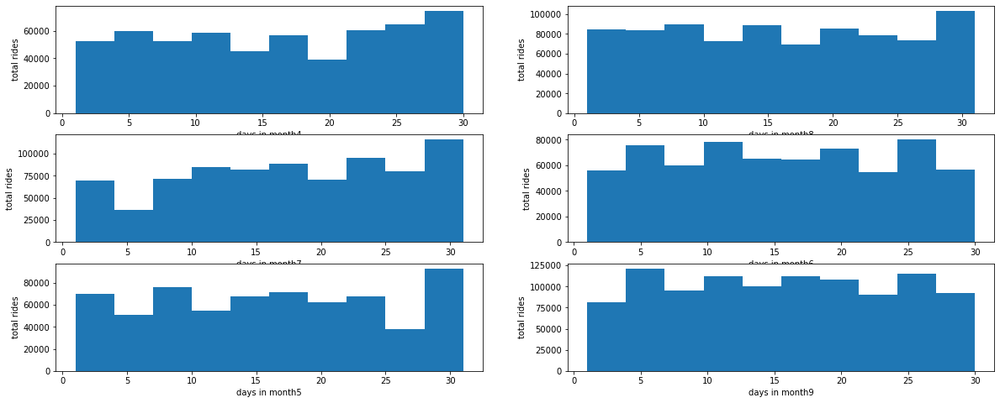

In [33]:
plt.figure(figsize= (20,8))

for i, month in enumerate(df['month'].unique(),1):
    plt.subplot(3,2,i)
    df_out = df[df['month']==month]
    plt.hist(df_out['day'])
    plt.xlabel('days in month{}'.format(month))
    plt.ylabel('total rides')

Almost in the couple of last days, in each month, Uber has maximum rides.

### B. Analysis Rush Hour in Every Day.

<AxesSubplot:xlabel='hour', ylabel='Lat'>

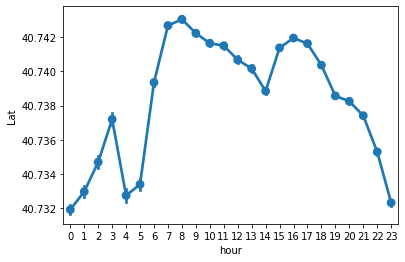

In [34]:
sns.pointplot(x = 'hour', y = 'Lat', data = df)

Text(0.5, 1.0, 'Hours of Day VS Latitude of Passanger')

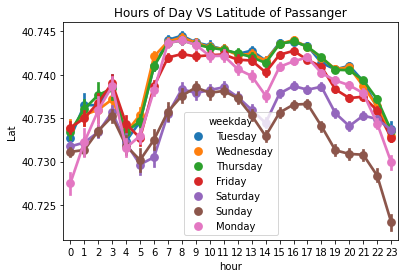

In [35]:
ax = sns.pointplot(x = 'hour', y = 'Lat', data = df, hue = 'weekday')
ax.set_title ('Hours of Day VS Latitude of Passanger')

From the visualization above, we can conclude that the rush hour of every day happened in the morning and evening. 

## 4. Which Base Number Gets Popular by Month Name

In [36]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,11,4,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,17,4,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,21,4,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,28,4,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,33,4,0


In [37]:
df.groupby(['Base','month'])['Date/Time'].count()

Base    month
B02512  4         35536
        5         36765
        6         32509
        7         35021
        8         31472
        9         34370
B02598  4        183263
        5        260549
        6        242975
        7        245597
        8        220129
        9        240600
B02617  4        108001
        5        122734
        6        184460
        7        310160
        8        355803
        9        377695
B02682  4        227808
        5        222883
        6        194926
        7        196754
        8        173280
        9        197138
B02764  4          9908
        5          9504
        6          8974
        7          8589
        8         48591
        9        178333
Name: Date/Time, dtype: int64

In [38]:
base = df.groupby(['Base','month'])['Date/Time'].count().reset_index()
base

,Base,month,Date/Time
0,B02512,4,35536
1,B02512,5,36765
2,B02512,6,32509
3,B02512,7,35021
4,B02512,8,31472
5,B02512,9,34370
6,B02598,4,183263
7,B02598,5,260549
8,B02598,6,242975
9,B02598,7,245597


<AxesSubplot:xlabel='month', ylabel='Date/Time'>

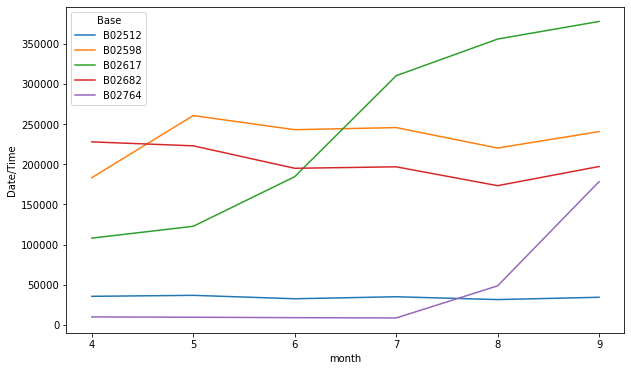

In [39]:
plt.figure(figsize= (10,6))
sns.lineplot(x = 'month', y= 'Date/Time', hue = 'Base', data = base)

B02617 is the most popular base if we look at the data monthly.

## 5. Cross Analysis

### A. Heatmap by Hour and Weekday

In [40]:
def count_rows(rows):
    return len(rows)

In [41]:
by_cross = df.groupby(['weekday', 'hour']).apply(count_rows)
by_cross

weekday    hour
Friday     0       13716
           1        8163
           2        5350
           3        6930
           4        8806
                   ...  
Wednesday  19      47017
           20      47772
           21      44553
           22      32868
           23      18146
Length: 168, dtype: int64

In [42]:
pivot = by_cross.unstack()
pivot

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,
Friday,13716,8163,5350,6930,8806,13450,23412,32061,31509,25230,...,36206,43673,48169,51961,54762,49595,43542,48323,49409,41260
Monday,6436,3737,2938,6232,9640,15032,23746,31159,29265,22197,...,28157,32744,38770,42023,37000,34159,32849,28925,20158,11811
Saturday,27633,19189,12710,9542,6846,7084,8579,11014,14411,17669,...,31418,38769,43512,42844,45883,41098,38714,43826,47951,43174
Sunday,32877,23015,15436,10597,6374,6169,6596,8728,12128,16401,...,28151,31112,33038,31521,28291,25948,25076,23967,19566,12166
Thursday,9293,5290,3719,5637,8505,14169,27065,37038,35431,27812,...,36699,44442,50560,56704,55825,51907,51990,51953,44194,27764
Tuesday,6237,3509,2571,4494,7548,14241,26872,36599,33934,25023,...,34846,41338,48667,55500,50186,44789,44661,39913,27712,14869
Wednesday,7644,4324,3141,4855,7511,13794,26943,36495,33826,25635,...,35148,43388,50684,55637,52732,47017,47772,44553,32868,18146


<AxesSubplot:xlabel='hour', ylabel='weekday'>

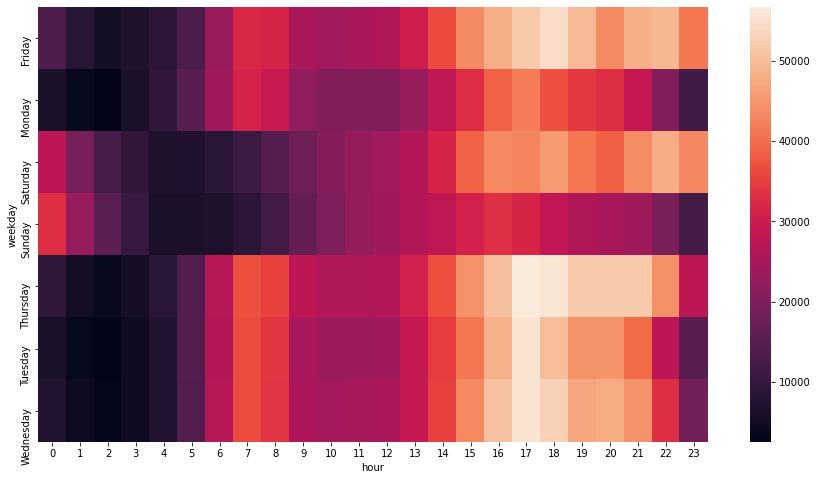

In [43]:
plt.figure(figsize = (15, 8))
sns.heatmap(pivot)

Almost in evening time we have a rush.

In [44]:
# Function to make heatmap

def heatmap(col1, col2):
    by_cross = df.groupby([col1, col2]).apply(count_rows)
    pivot = by_cross.unstack()
    plt.figure(figsize = (15, 8))
    return sns.heatmap(pivot)


### B. Heatmap by Day and Hour

<AxesSubplot:xlabel='hour', ylabel='day'>

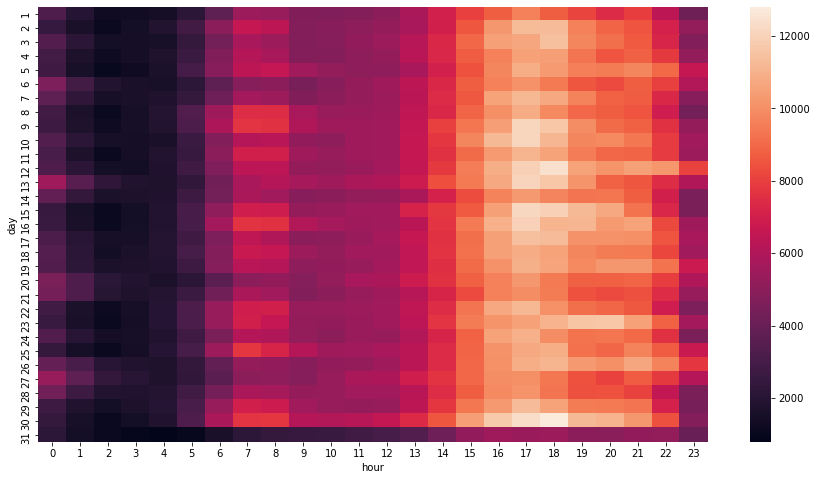

In [45]:
heatmap('day', 'hour')

### C. Heatmap by Month and Day

<AxesSubplot:xlabel='day', ylabel='month'>

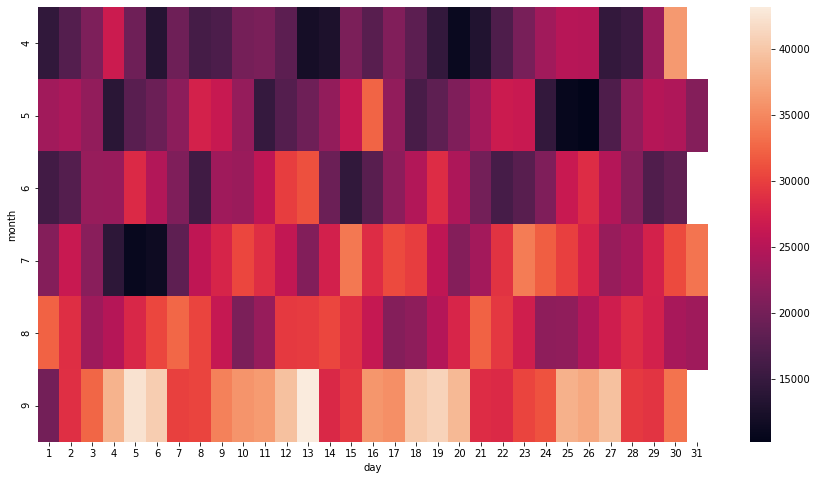

In [46]:
heatmap('month', 'day')

### D. Heatmap by Month and Weekday

<AxesSubplot:xlabel='weekday', ylabel='month'>

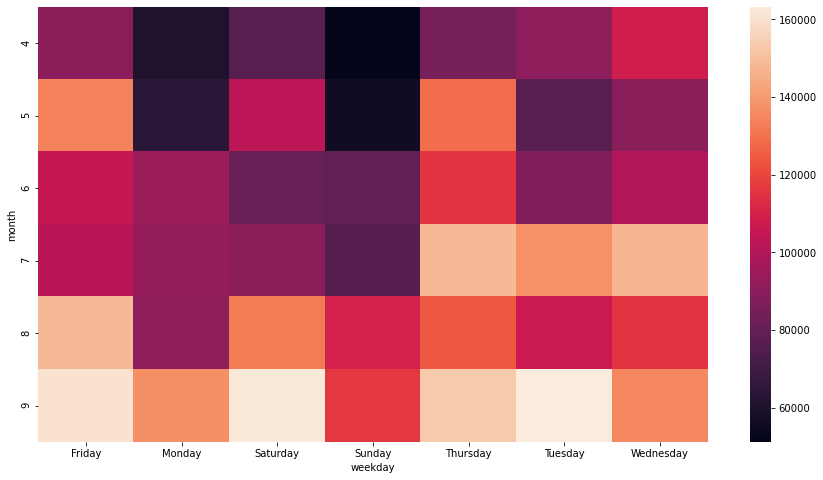

In [47]:
heatmap('month', 'weekday')

## 6. Spatial Analysis on Demand

### A. Analysis of Location Data Point

In [48]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,Tuesday,1,11,4,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,Tuesday,1,17,4,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,Tuesday,1,21,4,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,Tuesday,1,28,4,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,Tuesday,1,33,4,0


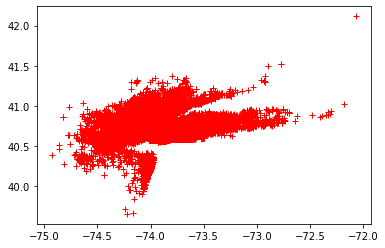

In [49]:
plt.plot(df['Lon'], df['Lat'], 'r+')

(40.6, 41.0)

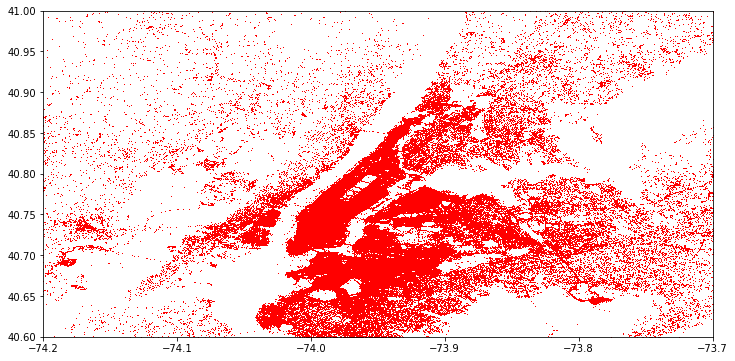

In [50]:
plt.figure(figsize=(12, 6))
plt.plot(df['Lon'], df['Lat'], 'r+', ms = 0.5)
plt.xlim(-74.2, -73.7)
plt.ylim(40.6, 41)

### B. Spatial Analysis Using Heatmap to Get a Clear Cut of Rush

In [51]:
df_out = df[df['weekday']=='Sunday']

In [52]:
df_out.shape

(490180, 9)

In [53]:
df_out.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
6965,2014-04-06 00:00:00,40.6547,-74.3033,B02512,Sunday,6,0,4,0
6966,2014-04-06 00:00:00,40.7356,-74.0006,B02512,Sunday,6,0,4,0
6967,2014-04-06 00:00:00,40.7421,-74.0041,B02512,Sunday,6,0,4,0
6968,2014-04-06 00:00:00,40.7401,-74.0053,B02512,Sunday,6,0,4,0
6969,2014-04-06 00:01:00,40.7368,-73.9877,B02512,Sunday,6,1,4,0


In [54]:
df_out.groupby(['Lat', 'Lon'])['weekday'].count()

Lat      Lon     
39.9374  -74.0722    1
39.9378  -74.0721    1
39.9384  -74.0742    1
39.9385  -74.0734    1
39.9415  -74.0736    1
                    ..
41.3141  -74.1249    1
41.3180  -74.1298    1
41.3195  -73.6905    1
41.3197  -73.6903    1
42.1166  -72.0666    1
Name: weekday, Length: 209230, dtype: int64

In [55]:
rush = df_out.groupby(['Lat', 'Lon'])['weekday'].count().reset_index()
rush

,Lat,Lon,weekday
0,39.9374,-74.0722,1
1,39.9378,-74.0721,1
2,39.9384,-74.0742,1
3,39.9385,-74.0734,1
4,39.9415,-74.0736,1
...,...,...,...
209225,41.3141,-74.1249,1
209226,41.3180,-74.1298,1
209227,41.3195,-73.6905,1
209228,41.3197,-73.6903,1


In [56]:
rush.columns = ['Lat', 'Lon', 'No of Trips']
rush

,Lat,Lon,No of Trips
0,39.9374,-74.0722,1
1,39.9378,-74.0721,1
2,39.9384,-74.0742,1
3,39.9385,-74.0734,1
4,39.9415,-74.0736,1
...,...,...,...
209225,41.3141,-74.1249,1
209226,41.3180,-74.1298,1
209227,41.3195,-73.6905,1
209228,41.3197,-73.6903,1


In [57]:
! pip install folium

In [58]:
import folium
from folium.plugins import HeatMap

In [59]:
basemap = folium.Map()

In [60]:
HeatMap(rush, zoom = 20, radius= 15).add_to(basemap)
basemap

The red color indicates the high number of rides at that area.

In [61]:
# function to automate the visualization

def plot(df, day):
    basemap = folium.Map()
    df_out = df[df['weekday'] == day]
    HeatMap(df_out.groupby(['Lat', 'Lon'])['weekday'].count().reset_index(), zoom = 20, radius= 15).add_to(basemap)
    return basemap

In [62]:
plot(df, 'Saturday')

## 7. Analysing Uber Pickups Each Month

In [63]:
uber_15 = pd.read_csv(r'D:\Belajar\Real Project\Uber Trip\Project 1..Uber New York Trip\uber-pickups-in-new-york-city/uber-raw-data-janjune-15.csv')
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [64]:
uber_15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [65]:
uber_15['Pickup_date'] = pd.to_datetime(uber_15['Pickup_date'], format = '%Y/%m/%d %H:%M:%S')

In [66]:
uber_15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

In [67]:
uber_15['Pickup_date']

0          2015-05-17 09:47:00
1          2015-05-17 09:47:00
2          2015-05-17 09:47:00
3          2015-05-17 09:47:00
4          2015-05-17 09:47:00
                   ...        
14270474   2015-05-08 15:43:00
14270475   2015-05-08 15:43:00
14270476   2015-05-08 15:43:00
14270477   2015-05-08 15:44:00
14270478   2015-05-08 15:44:00
Name: Pickup_date, Length: 14270479, dtype: datetime64[ns]

In [68]:
uber_15['Weekday'] = uber_15['Pickup_date'].dt.day_name()
uber_15['Day'] = uber_15['Pickup_date'].dt.day
uber_15['Minute'] = uber_15['Pickup_date'].dt.minute
uber_15['Month'] = uber_15['Pickup_date'].dt.month
uber_15['Hour'] = uber_15['Pickup_date'].dt.hour

In [69]:
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,Weekday,Day,Minute,Month,Hour
0,B02617,2015-05-17 09:47:00,B02617,141,Sunday,17,47,5,9
1,B02617,2015-05-17 09:47:00,B02617,65,Sunday,17,47,5,9
2,B02617,2015-05-17 09:47:00,B02617,100,Sunday,17,47,5,9
3,B02617,2015-05-17 09:47:00,B02774,80,Sunday,17,47,5,9
4,B02617,2015-05-17 09:47:00,B02617,90,Sunday,17,47,5,9


In [70]:
uber_15['Month'].value_counts()

6    2816895
5    2695553
4    2280837
2    2263620
3    2259773
1    1953801
Name: Month, dtype: int64

In [71]:
px.bar(x = uber_15['Month'].value_counts().index,
        y = uber_15['Month'].value_counts())

The visualization tells us that the 6th month has the highest number of pickups.

## 8.	Analysing Rush in New York City

D:\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='Hour', ylabel='count'>

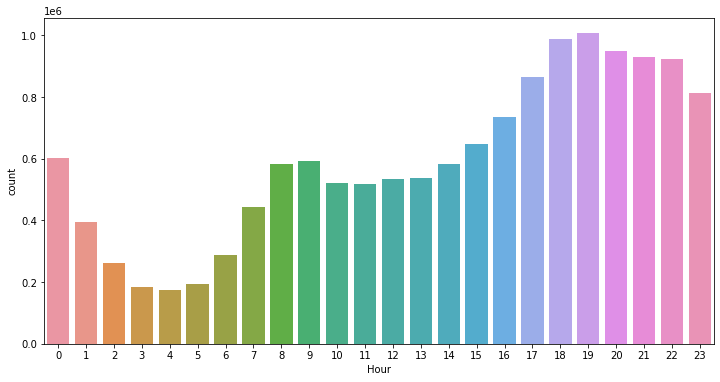

In [72]:
plt.figure(figsize = (12, 6))
sns.countplot(uber_15['Hour'])

### A. Depth Analysis of Rush in New York City 

In [73]:
summary = uber_15.groupby(['Weekday', 'Hour'])['Pickup_date'].count().reset_index()
summary.head()

,Weekday,Hour,Pickup_date
0,Friday,0,85939
1,Friday,1,46616
2,Friday,2,28102
3,Friday,3,19518
4,Friday,4,23575


<AxesSubplot:xlabel='Hour', ylabel='Pickup_date'>

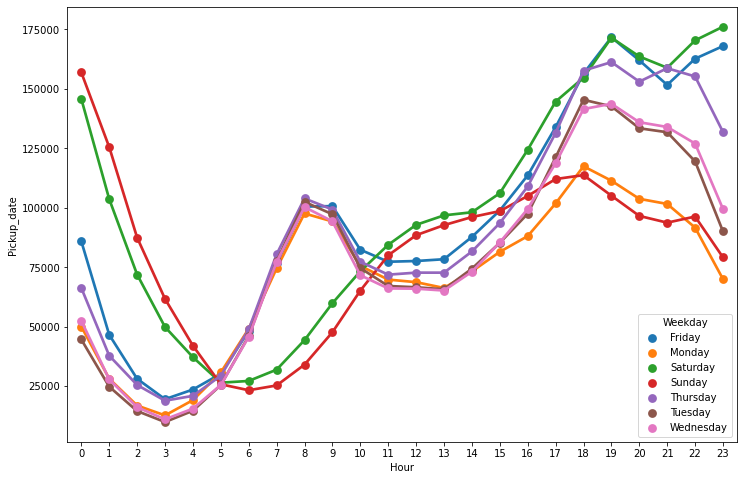

In [74]:
plt.figure(figsize = (12, 8))
sns.pointplot(x = 'Hour', y = 'Pickup_date', hue = 'Weekday', data = summary)

We can see that there is no rush in weekend morning. 

In [75]:
uber_foil = pd.read_csv(r'D:\Belajar\Real Project\Uber Trip\Project 1..Uber New York Trip\uber-pickups-in-new-york-city/Uber-Jan-Feb-FOIL.csv')
uber_foil.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


In [76]:
uber_foil.shape

(354, 4)

In [77]:
uber_foil['dispatching_base_number'].unique()

array(['B02512', 'B02765', 'B02764', 'B02682', 'B02617', 'B02598'],
      dtype=object)

<AxesSubplot:xlabel='dispatching_base_number', ylabel='active_vehicles'>

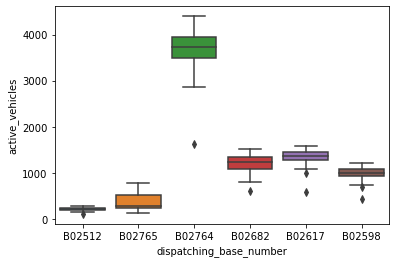

In [78]:
sns.boxplot(x = 'dispatching_base_number', y = 'active_vehicles', data = uber_foil)

<AxesSubplot:xlabel='dispatching_base_number', ylabel='trips'>

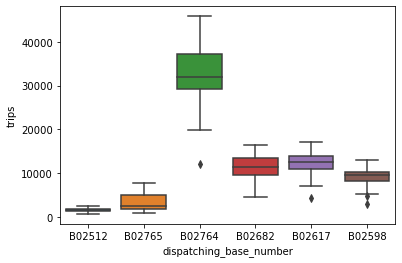

In [79]:
sns.boxplot(x = 'dispatching_base_number', y = 'trips', data = uber_foil)

In [80]:
uber_foil['trips/vehicle'] = uber_foil['trips'] / uber_foil['active_vehicles']

In [81]:
uber_foil.head()

,dispatching_base_number,date,active_vehicles,trips,trips/vehicle
0,B02512,1/1/2015,190,1132,5.957895
1,B02765,1/1/2015,225,1765,7.844444
2,B02764,1/1/2015,3427,29421,8.585060
3,B02682,1/1/2015,945,7679,8.125926
4,B02617,1/1/2015,1228,9537,7.766287


In [82]:
uber_foil.set_index('date')

,dispatching_base_number,active_vehicles,trips,trips/vehicle
date,,,,
1/1/2015,B02512,190,1132,5.957895
1/1/2015,B02765,225,1765,7.844444
1/1/2015,B02764,3427,29421,8.585060
1/1/2015,B02682,945,7679,8.125926
1/1/2015,B02617,1228,9537,7.766287
...,...,...,...,...
2/28/2015,B02764,3952,39812,10.073887
2/28/2015,B02617,1372,14022,10.220117
2/28/2015,B02682,1386,14472,10.441558


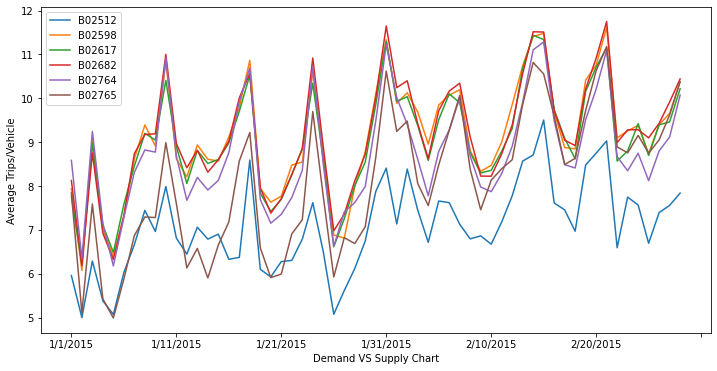

In [83]:
plt.figure(figsize = (12, 6))
uber_foil.set_index('date').groupby(['dispatching_base_number'])['trips/vehicle'].plot()
plt.ylabel('Average Trips/Vehicle')
plt.xlabel('Demand VS Supply Chart')
plt.legend()